## Bibliotecas Utilizadas

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import regex as re
from collections import Counter
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from wordcloud import WordCloud
from operator import itemgetter


# Carregando os dados 

In [3]:
politicos = {}
lista_dir = os.listdir("./politicos/")
nome_politicos = []
for nome in lista_dir:
    politicos[nome[:-4]] = df_amoedo = pd.read_csv(
        f"./politicos/{nome}",
        delimiter=",",
        encoding='utf-8',
        usecols=[1,2,8]
    )
    nome_politicos.append(nome[:-4])

In [4]:
print(len(nome_politicos))
politicos['Doria'].head()

11


,created_at,text,id
0,2021-04-19T13:04:16Z,São ao todo 41 milhões e 400 mil doses da vaci...,1384130730851135495
1,2021-04-19T13:04:15Z,"Estive hoje, às 5h30 da manhã, no Aeroporto de...",1384130727348867079
2,2021-04-19T10:03:50Z,Insumos para mais 5 milhões de doses da Vacina...,1384085323588665344
3,2021-04-19T09:17:48Z,"Bom dia, pessoal. Estamos em Guarulhos receben...",1384073738887438337
4,2021-04-19T01:28:03Z,A operação Paz e Proteção impediu a realização...,1383955522076827650


## Análise do político João Doria

In [79]:
stop_words = set(stopwords.words('portuguese'))
symbols = set(['-', 'r$', 'R$'])
palavras = "".join(politicos['Doria']['text']).lower().split()
palavras = [w for w in palavras if not w in (stop_words | symbols)]
palavras = [w for w in palavras if re.match(r'https://*', w) == None]
c = Counter(palavras)
dados = {(1,x,y) for x,y in zip(c,c.values()) if y > 5}
print(type(dados), len(dados))

palavras = "".join(politicos['Bolsonaro']['text']).lower().split()
palavras = [w for w in palavras if not w in (stop_words | symbols)]
palavras = [w for w in palavras if re.match(r'https://*', w) == None]
c = Counter(palavras)
d = {(1,x,y) for x,y in zip(c,c.values()) if y > 5}
print(type(d), len(d))
for x in d:
    dados.add(x)
print(type(dados), len(dados))

palavras = "".join(politicos['Lula']['text']).lower().split()
palavras = [w for w in palavras if not w in (stop_words | symbols)]
palavras = [w for w in palavras if re.match(r'https://*', w) == None]
c = Counter(palavras)
d = {(1,x,y) for x,y in zip(c,c.values()) if y > 5}
print(type(d), len(d))
for x in d:
    dados.add(x)
print(type(dados), len(dados))
#sorted(d, key=itemgetter(2), reverse=True)

<class 'set'> 1559
<class 'set'> 1476
<class 'set'> 2990
<class 'set'> 1634
<class 'set'> 4567


## WordCloud de todos

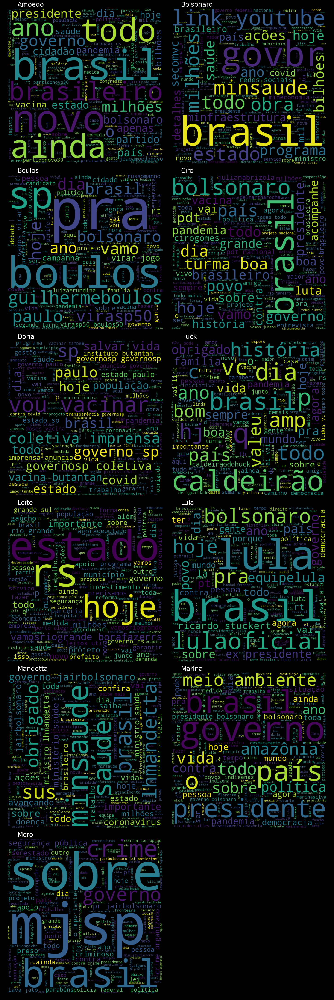

In [8]:
palavras = []
fig, ax = plt.subplots(nrows=6, ncols=2, figsize=(20, 60), facecolor='k')
xc = 0
yc = 0
for idx in range(11):
    palavras.append("".join(politicos[nome_politicos[idx]]['text']).lower().split())
    palavras[idx] = [w for w in palavras[idx] if not w in (stop_words | symbols)]
    palavras[idx] = [w for w in palavras[idx] if re.match(r'https://*', w) == None]
    sumario = " ".join(s for s in palavras[idx])
    wordcloud = WordCloud(width=800, height=800).generate(sumario)
    ax[xc][yc].imshow(wordcloud)
    ax[xc][yc].text(50, -10, nome_politicos[idx], fontsize=28, color='white')
    yc += 1
    if (yc == 2):
        yc = 0
        xc += 1
        if (xc == 6):
            xc = 0

plt.axis('off')
plt.tight_layout(pad=0) 
plt.show()

In [18]:
set_palavras = set()
num = 0
for c in palavras:
    for p in c:
        set_palavras.add(p)
        num += 1
num    

509008

In [17]:
len(set_palavras)

85147